# Replikasi jurnal "Pre-trained CNNs Models for Content based Image Retrieval"
### DOI: 10.14569/IJACSA.2021.0120723




## Import Library & Setup Environment

In [2]:
# Basic Utilities
import os
import numpy as np
import pandas as pd
from tqdm import tqdm

# Image Processing
import cv2
from PIL import Image

# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from IPython.display import display

# Machine Learning / Similarity
from sklearn.metrics.pairwise import cosine_similarity

# Deep Learning (PyTorch)
import torch
from torchvision import models, transforms

# Setup Environment
data_dir = "Corel-1K"
data_dir_GHIM = "GHIM-10K"

print("Classes available:", os.listdir(data_dir))
print("Classes available:", os.listdir(data_dir_GHIM))

# Device Setup: GPU jika tersedia, jika tidak CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Classes available: ['africans', 'beaches', 'buildings', 'buses', 'dinosaurs', 'elephants', 'flowers', 'food', 'horses', 'mountains']
Classes available: ['aircraft', 'buildings', 'butterfly', 'cars', 'dragon fly', 'fireworks', 'flowers', 'hen', 'horses', 'insects', 'motorcycles', 'mountains', 'sea shores', 'ships', 'sunset', 'temples', 'trees', 'valleys', 'walls', 'yacht']
Using device: cuda


# A. Dataset Corel-1K

## Tahap 1: Ekstraksi Fitur Menggunakan Deskriptor Tradisional (Color Layout & GLCM) dan Model CNN Pre-trained (SqueezeNet & ResNet18)

In [9]:
# GLCM Custom
def extract_glcm_features(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (64,64))
    img = (img / 32).astype(np.uint8)
    levels = 8
    glcm = np.zeros((levels, levels), dtype=np.float32)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]-1):
            row = img[i,j]
            col = img[i,j+1]
            glcm[row,col] += 1
    glcm = glcm / np.sum(glcm)
    contrast = np.sum(glcm * (np.arange(levels).reshape(-1,1) - np.arange(levels).reshape(1,-1))**2)
    energy = np.sum(glcm**2)
    homogeneity = np.sum(glcm / (1.0 + np.abs(np.arange(levels).reshape(-1,1) - np.arange(levels).reshape(1,-1))))
    correlation = 0
    return np.array([contrast, energy, homogeneity, correlation])

# Color Layout
def extract_color_layout(img_path):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (64,64))
    return img.mean(axis=(0,1))  # mean RGB sebagai proxy fitur CL

# CNN Models
squeezenet = models.squeezenet1_1(pretrained=True).to(device).eval()
resnet18 = models.resnet18(pretrained=True).to(device).eval()

transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


C:\Users\acer\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\acer\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can al

## Tahap 2: Pre-trained Models

### 1. SqueezeNet – Pre-trained CNNs for Features Extraction

In [ ]:
img_paths = []
labels = []

for cls in os.listdir(data_dir):
    cls_path = os.path.join(data_dir, cls)
    for f in os.listdir(cls_path):
        img_paths.append(os.path.join(cls_path, f))
        labels.append(cls)

squeezenet_features = []

# Ekstraksi fitur SqueezeNet
for path in tqdm(img_paths, desc="Extracting SqueezeNet Features"):
    img = Image.open(path).convert('RGB')
    img_t = transform(img).unsqueeze(0).to(device) # type: ignore

    with torch.no_grad():
        sq_feat = squeezenet.features(img_t)
        sq_feat = torch.flatten(sq_feat, 1)
        squeezenet_features.append(sq_feat.squeeze().cpu().numpy())

squeezenet_features = np.array(squeezenet_features)

Extracting SqueezeNet Features: 100%|██████████| 1000/1000 [00:12<00:00, 77.15it/s]


### 2. ResNet18 – Pre-trained CNNs for Feature Extraction

In [11]:
resnet18_features = []

# Ekstraksi fitur ResNet18
for path in tqdm(img_paths, desc="Extracting ResNet18 Features"):
    img = Image.open(path).convert('RGB')
    img_t = transform(img).unsqueeze(0).to(device) # type: ignore

    with torch.no_grad():
        x = resnet18.conv1(img_t)
        x = resnet18.bn1(x)
        x = resnet18.relu(x)
        x = resnet18.maxpool(x)
        x = resnet18.layer1(x)
        x = resnet18.layer2(x)
        x = resnet18.layer3(x)
        x = resnet18.layer4(x)
        x = resnet18.avgpool(x)        # 512-dim feature
        resnet18_features.append(x.squeeze().cpu().numpy())

resnet18_features = np.array(resnet18_features)

Extracting ResNet18 Features: 100%|██████████| 1000/1000 [00:12<00:00, 79.81it/s]


### 3. Visual Features – Color Layout (CL) & GLCM Texture Descriptors

In [12]:
cl_features = []
glcm_features = []

# Ekstraksi fitur CL & GLCM
for path in tqdm(img_paths, desc="Extracting CL & GLCM Features"):
    # Color Layout
    cl_features.append(extract_color_layout(path))
    # GLCM Texture Features
    glcm_features.append(extract_glcm_features(path))

cl_features = np.array(cl_features)
glcm_features = np.array(glcm_features)


Extracting CL & GLCM Features: 100%|██████████| 1000/1000 [00:28<00:00, 34.66it/s]


## Tahap 3: Image Retrieval & Similarity Matching

In [13]:
# Retrieve indeks gambar paling mirip berdasarkan cosine similarity.
def retrieve(query_feat, all_feats, top_k=10):
    sims = cosine_similarity([query_feat], all_feats)[0] # type: ignore
    idxs = np.argsort(sims)[::-1][:top_k]
    return idxs

def evaluate_recall_precision(features, labels, top_k=10):
    classes = sorted(list(set(labels)))
    results = []
    for cls in classes:
        idxs_cls = [i for i,l in enumerate(labels) if l==cls]
        R_list, P_list = [], []
        for q in idxs_cls:
            retrieved_idx = retrieve(features[q], features, top_k)
            retrieved_labels = [labels[i] for i in retrieved_idx]
            R = retrieved_labels.count(cls) / len(idxs_cls)
            P = retrieved_labels.count(cls) / top_k
            R_list.append(R)
            P_list.append(P)
        results.append([cls, np.mean(R_list), np.mean(P_list)])
    return pd.DataFrame(results, columns=['Class','R','P'])

## Tahap 4: Evaluasi

In [14]:
df_cl_glcm = evaluate_recall_precision(np.hstack([cl_features, glcm_features]), labels)
df_squeeze = evaluate_recall_precision(squeezenet_features, labels)
df_resnet = evaluate_recall_precision(resnet18_features, labels)

df_table = pd.DataFrame()
df_table['Class'] = df_cl_glcm['Class']

df_table['CL&GLCM R'] = df_cl_glcm['R']
df_table['CL&GLCM P'] = df_cl_glcm['P']

df_table['SqueezeNet R'] = df_squeeze['R']
df_table['SqueezeNet P'] = df_squeeze['P']

df_table['ResNet18 R'] = df_resnet['R']
df_table['ResNet18 P'] = df_resnet['P']

# MEAN
mean_row = {
    'Class': 'Mean',
    'CL&GLCM R': df_cl_glcm['R'].mean(),
    'CL&GLCM P': df_cl_glcm['P'].mean(),
    'SqueezeNet R': df_squeeze['R'].mean(),
    'SqueezeNet P': df_squeeze['P'].mean(),
    'ResNet18 R': df_resnet['R'].mean(),
    'ResNet18 P': df_resnet['P'].mean(),
}

df_table = pd.concat([df_table, pd.DataFrame([mean_row])], ignore_index=True)

for col in df_table.columns[1:]:
    df_table[col] = df_table[col].astype(float).map("{:.4f}".format)

display(df_table)

,Class,CL&GLCM R,CL&GLCM P,SqueezeNet R,SqueezeNet P,ResNet18 R,ResNet18 P
0,africans,0.0442,0.4420,0.0630,0.6300,0.0904,0.9040
1,beaches,0.0369,0.3690,0.0522,0.5220,0.0897,0.8970
2,buildings,0.0289,0.2890,0.0786,0.7860,0.0943,0.9430
3,buses,0.0405,0.4050,0.1000,1.0000,0.1000,1.0000
4,dinosaurs,0.0846,0.8460,0.0993,0.9930,0.1000,1.0000
5,elephants,0.0314,0.3140,0.0898,0.8980,0.1000,1.0000
6,flowers,0.0614,0.6140,0.0997,0.9970,0.0999,0.9990
7,food,0.0521,0.5210,0.0760,0.7600,0.0975,0.9750
8,horses,0.0858,0.8580,0.0964,0.9640,0.0994,0.9940
9,mountains,0.0391,0.3910,0.0903,0.9030,0.0950,0.9500


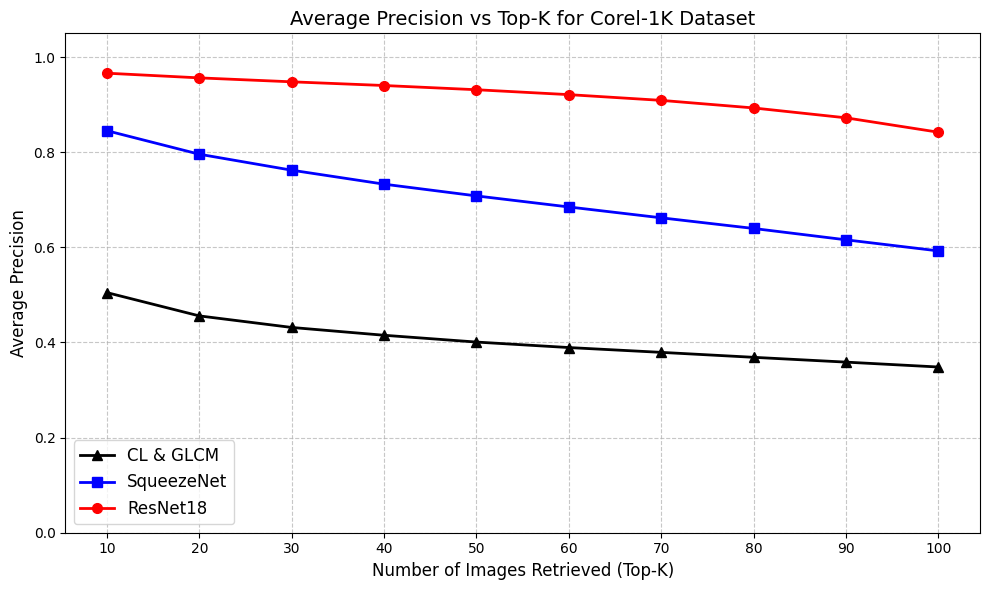

In [15]:
def average_precision_vs_topk(features_list, labels, top_k_max=100):
    top_ks = list(range(10, top_k_max + 1, 10))
    avg_prec = {name: [] for name in features_list}

    for top_k in top_ks:
        for name, feats in features_list.items():
            df = evaluate_recall_precision(feats, labels, top_k=top_k)
            avg_prec[name].append(df['P'].mean())

    plt.figure(figsize=(10, 6))

    markers = {
        'ResNet18': 'o',
        'SqueezeNet': 's',
        'CL & GLCM': '^'
    }

    colors = {
        'ResNet18': 'red',
        'SqueezeNet': 'blue',
        'CL & GLCM': 'black'
    }

    for name in features_list:
        plt.plot(top_ks, avg_prec[name],
                 marker=markers[name],
                 color=colors[name],
                 linestyle='-',
                 linewidth=2,
                 markersize=7,
                 label=name)

    plt.xlabel("Number of Images Retrieved (Top-K)", fontsize=12)
    plt.ylabel("Average Precision", fontsize=12)
    plt.title("Average Precision vs Top-K for Corel-1K Dataset", fontsize=14)
    plt.xticks(top_ks)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)
    plt.ylim(0, 1.05)
    plt.tight_layout()
    plt.show()


# Dictionary fitur
features_dict = {
    'CL & GLCM': np.hstack([cl_features, glcm_features]),
    'SqueezeNet': squeezenet_features,
    'ResNet18': resnet18_features
}

average_precision_vs_topk(features_dict, labels, top_k_max=100)

In [22]:
def show_topk_per_class(features, labels, img_paths, top_k=4):
    classes = sorted(list(set(labels)))

    for cls in classes:
        print(f"\n=== Class: {cls} ===")

        # Mengambil index pertama dari kelas sebagai query
        query_idx = labels.index(cls)

        # Retrieve top-k hasil
        retrieved_idx = retrieve(features[query_idx], features, top_k)

        plt.figure(figsize=(15, 3))
        plt.suptitle(f"Query Class: {cls}", fontsize=14)

        query_img = Image.open(img_paths[query_idx])
        plt.subplot(1, top_k + 1, 1)
        plt.imshow(query_img)
        plt.axis('off')
        plt.title("Query", fontsize=10)
        plt.gca().add_patch(patches.Rectangle((0,0), query_img.width, query_img.height,
                                              edgecolor='blue', fill=False, linewidth=3))

        for i, idx in enumerate(retrieved_idx):
            img = Image.open(img_paths[idx])
            plt.subplot(1, top_k + 1, i + 2)
            plt.imshow(img)
            plt.axis('off')
            color = 'green' if labels[idx] == cls else 'red'
            plt.gca().add_patch(patches.Rectangle((0,0), img.width, img.height,
                                                  edgecolor=color, fill=False, linewidth=3))
            plt.title(labels[idx], fontsize=9)

        plt.tight_layout()
        plt.show()



=== Class: africans ===


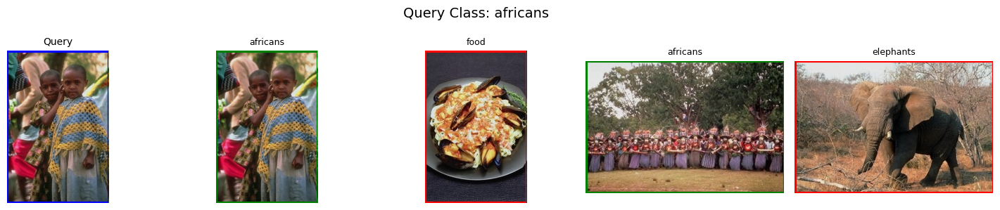


=== Class: beaches ===


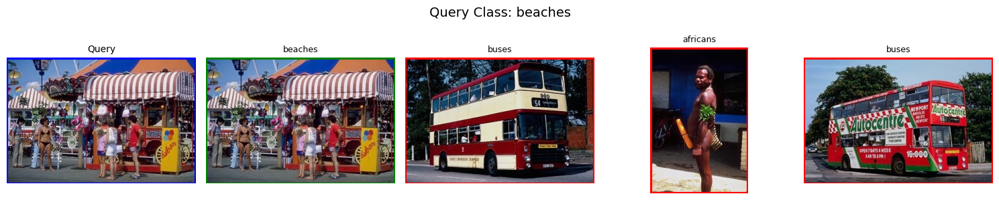


=== Class: buildings ===


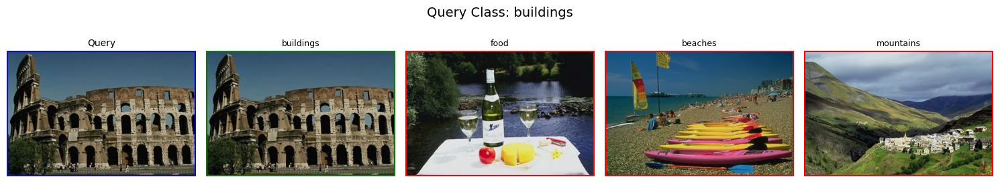


=== Class: buses ===


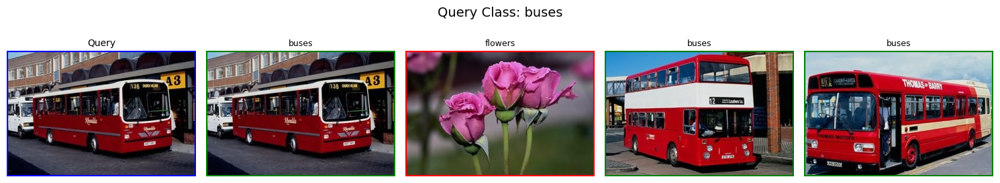


=== Class: dinosaurs ===


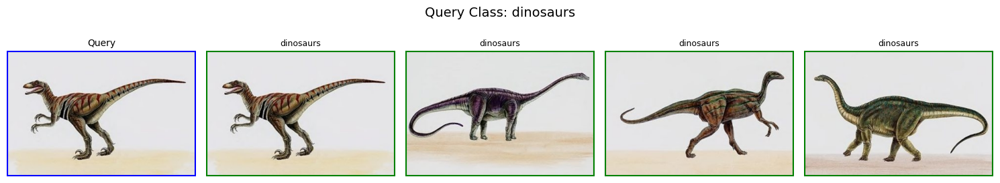


=== Class: elephants ===


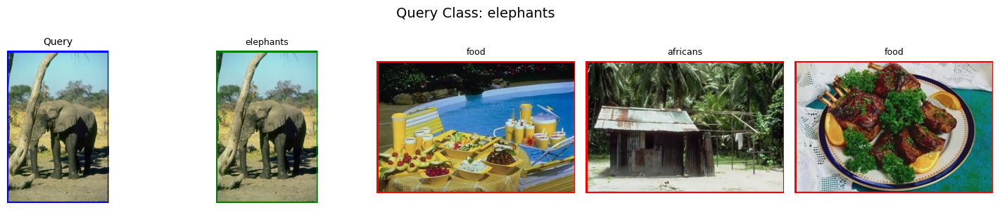


=== Class: flowers ===


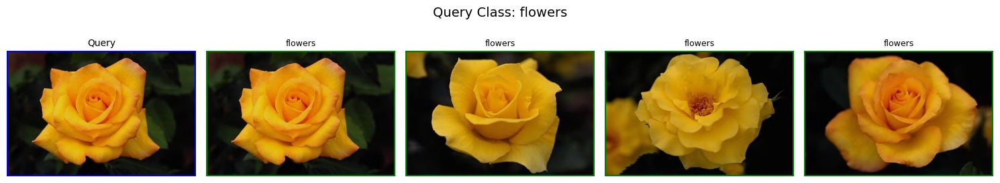


=== Class: food ===


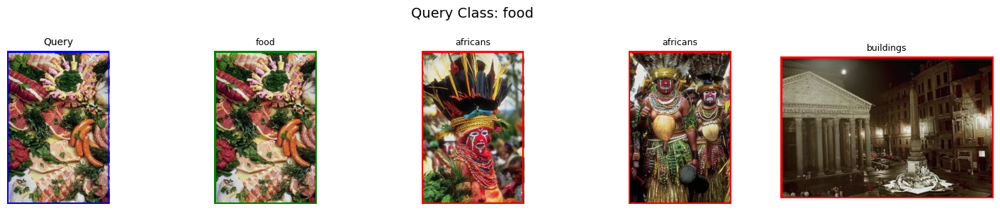


=== Class: horses ===


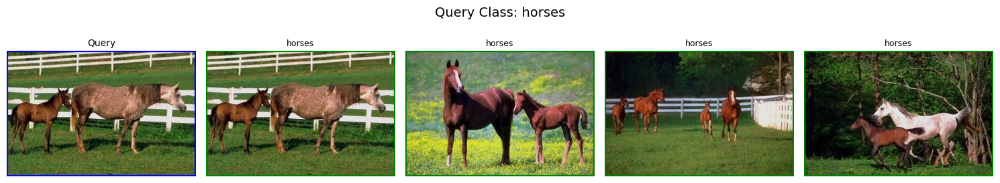


=== Class: mountains ===


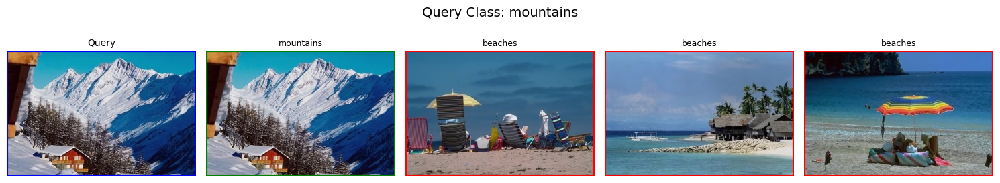

In [23]:
features_cl_glcm = np.hstack([cl_features, glcm_features])
show_topk_per_class(features_cl_glcm, labels, img_paths, top_k=4)



=== Class: africans ===


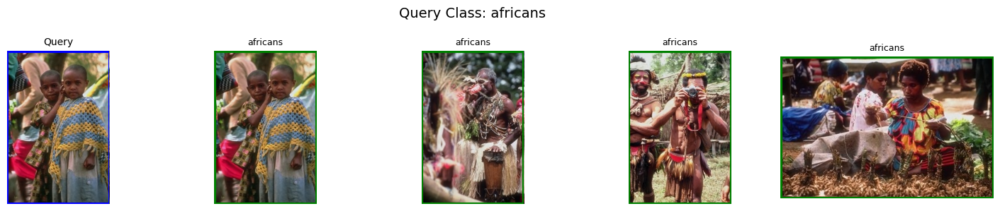


=== Class: beaches ===


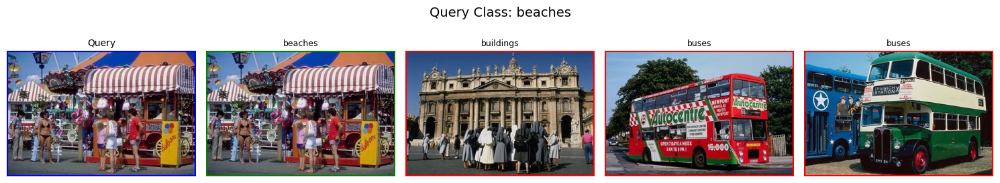


=== Class: buildings ===


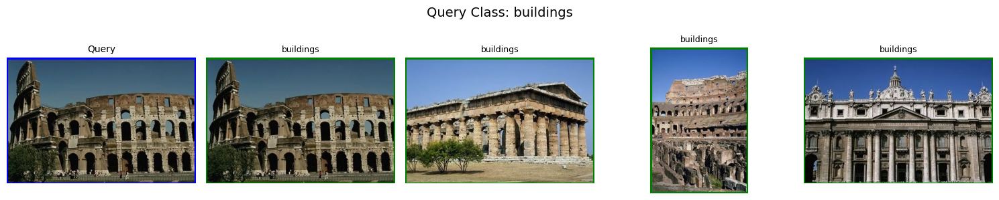


=== Class: buses ===


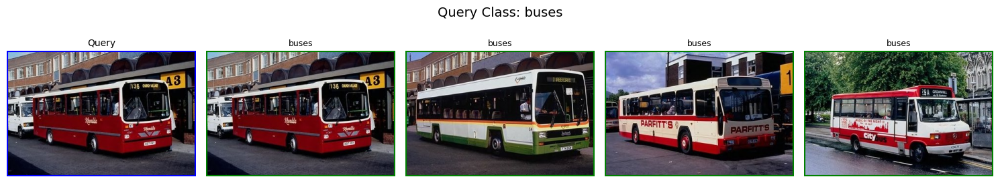


=== Class: dinosaurs ===


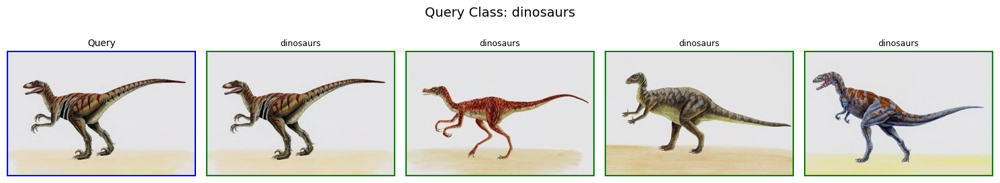


=== Class: elephants ===


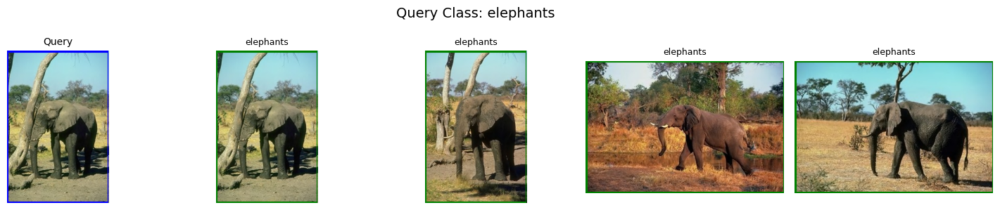


=== Class: flowers ===


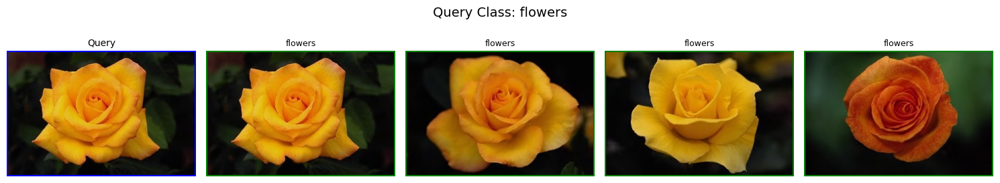


=== Class: food ===


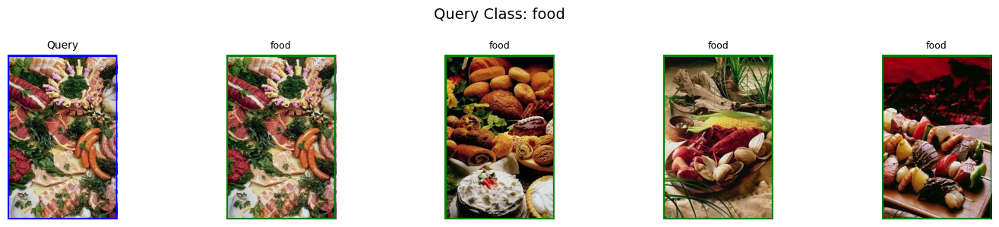


=== Class: horses ===


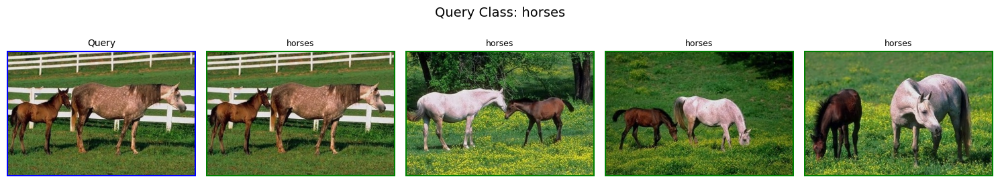


=== Class: mountains ===


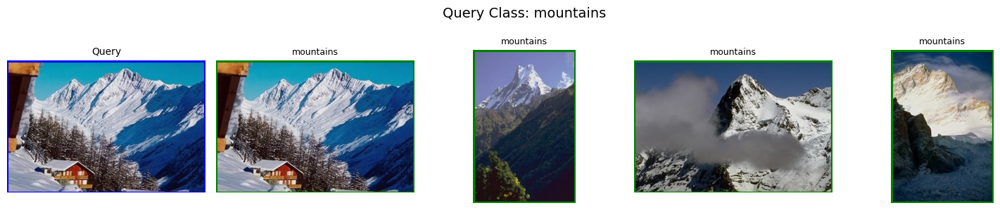

In [24]:
show_topk_per_class(squeezenet_features, labels, img_paths, top_k=4)



=== Class: africans ===


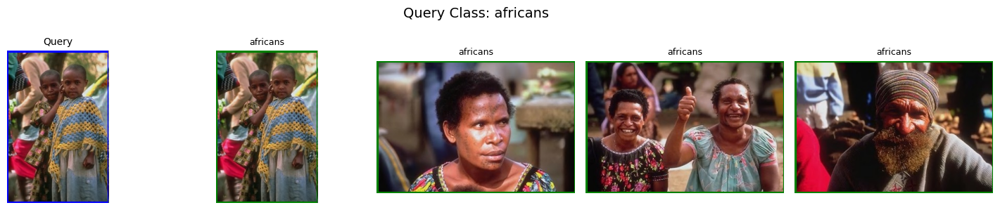


=== Class: beaches ===


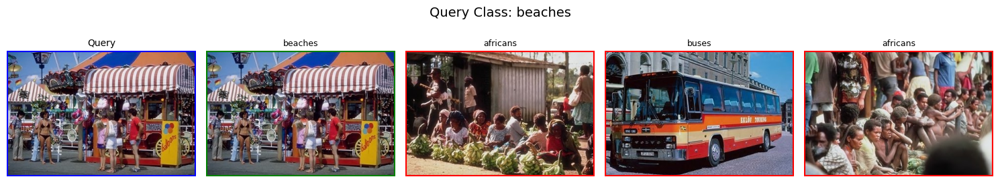


=== Class: buildings ===


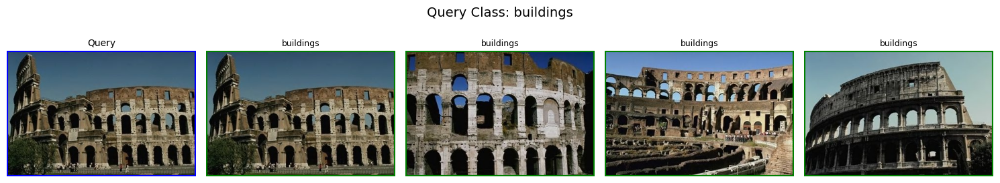


=== Class: buses ===


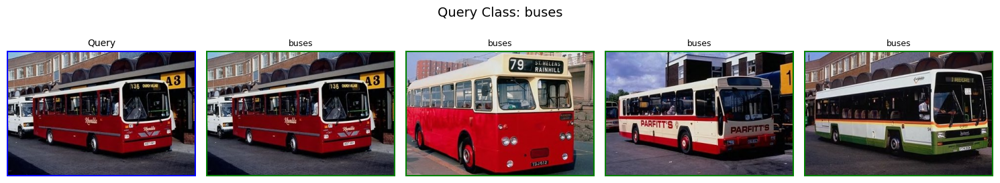


=== Class: dinosaurs ===


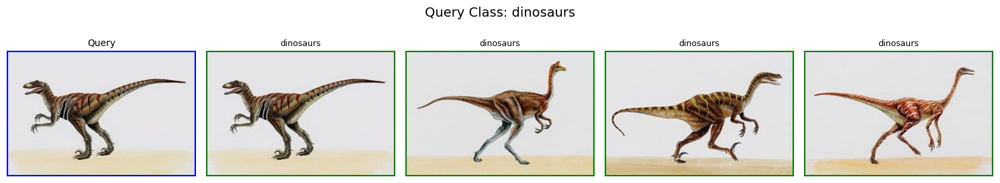


=== Class: elephants ===


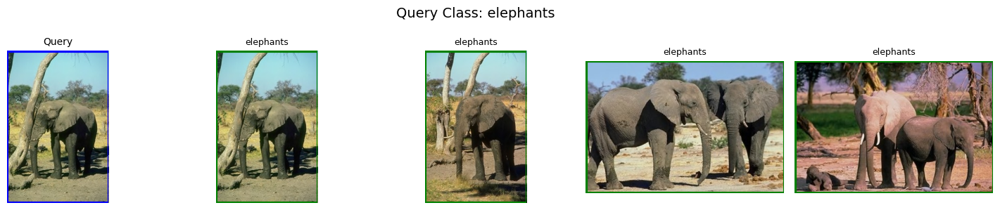


=== Class: flowers ===


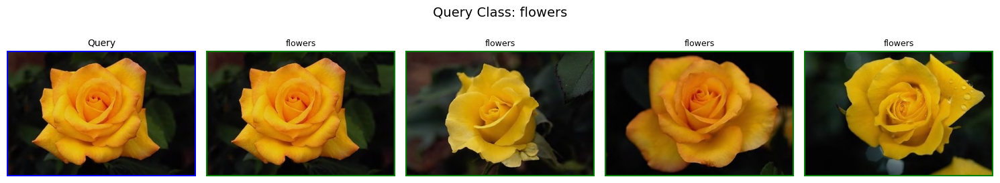


=== Class: food ===


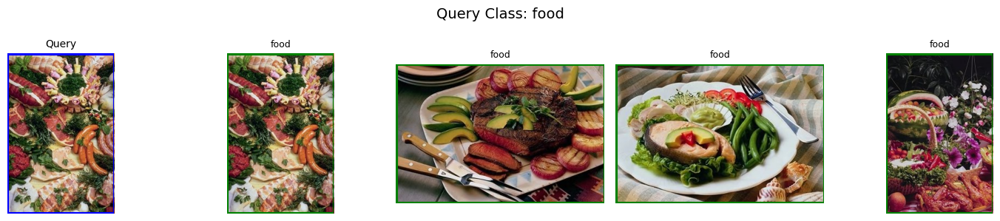


=== Class: horses ===


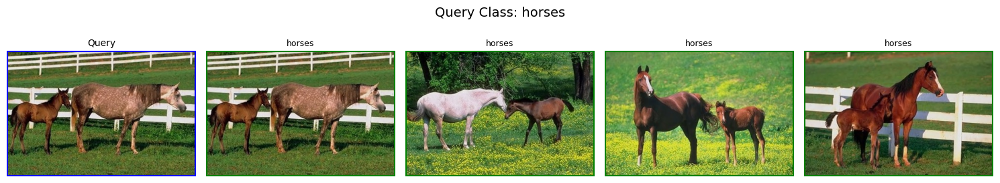


=== Class: mountains ===


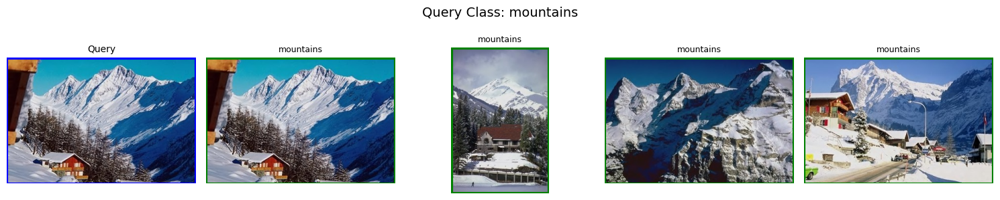

In [25]:
show_topk_per_class(resnet18_features, labels, img_paths, top_k=4)


# B. Dataset GHIM-10K

## Tahap 1: Ekstraksi Fitur Menggunakan Deskriptor Tradisional (Color Layout & GLCM) dan Model CNN Pre-trained (SqueezeNet & ResNet18)

In [4]:
# GLCM Custom
def extract_glcm_features(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (64,64))
    img = (img / 32).astype(np.uint8)
    levels = 8
    glcm = np.zeros((levels, levels), dtype=np.float32)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]-1):
            row = img[i,j]
            col = img[i,j+1]
            glcm[row,col] += 1
    glcm = glcm / np.sum(glcm)
    contrast = np.sum(glcm * (np.arange(levels).reshape(-1,1) - np.arange(levels).reshape(1,-1))**2)
    energy = np.sum(glcm**2)
    homogeneity = np.sum(glcm / (1.0 + np.abs(np.arange(levels).reshape(-1,1) - np.arange(levels).reshape(1,-1))))
    correlation = 0
    return np.array([contrast, energy, homogeneity, correlation])

# Color Layout
def extract_color_layout(img_path):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (64,64))
    return img.mean(axis=(0,1))  # mean RGB sebagai proxy fitur CL

# CNN Models
squeezenet = models.squeezenet1_1(pretrained=True).to(device).eval()
resnet18 = models.resnet18(pretrained=True).to(device).eval()

transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


C:\Users\acer\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\acer\AppData\Roaming\Python\Python312\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can al

## Tahap 2: Pre-trained Models

### 1. SqueezeNet – Pre-trained CNNs for Features Extraction

In [5]:
img_paths = []
labels = []

for cls in os.listdir(data_dir_GHIM):
    cls_path = os.path.join(data_dir_GHIM, cls)
    for f in os.listdir(cls_path):
        img_paths.append(os.path.join(cls_path, f))
        labels.append(cls)

squeezenet_features = []

# Ekstraksi fitur SqueezeNet
for path in tqdm(img_paths, desc="Extracting SqueezeNet Features"):
    img = Image.open(path).convert('RGB')
    img_t = transform(img).unsqueeze(0).to(device) # type: ignore

    with torch.no_grad():
        sq_feat = squeezenet.features(img_t)
        sq_feat = torch.flatten(sq_feat, 1)
        squeezenet_features.append(sq_feat.squeeze().cpu().numpy())

squeezenet_features = np.array(squeezenet_features)

Extracting SqueezeNet Features:   0%|          | 0/10016 [00:00<?, ?it/s]

Extracting SqueezeNet Features: 100%|██████████| 10016/10016 [08:19<00:00, 20.04it/s]


### 2. ResNet18 – Pre-trained CNNs for Feature Extraction

In [6]:
resnet18_features = []

# Ekstraksi fitur ResNet18
for path in tqdm(img_paths, desc="Extracting ResNet18 Features"):
    img = Image.open(path).convert('RGB')
    img_t = transform(img).unsqueeze(0).to(device) # type: ignore

    with torch.no_grad():
        x = resnet18.conv1(img_t)
        x = resnet18.bn1(x)
        x = resnet18.relu(x)
        x = resnet18.maxpool(x)
        x = resnet18.layer1(x)
        x = resnet18.layer2(x)
        x = resnet18.layer3(x)
        x = resnet18.layer4(x)
        x = resnet18.avgpool(x)        # 512-dim feature
        resnet18_features.append(x.squeeze().cpu().numpy())

resnet18_features = np.array(resnet18_features)

Extracting ResNet18 Features: 100%|██████████| 10016/10016 [04:00<00:00, 41.65it/s]


### 3. Visual Features – Color Layout (CL) & GLCM Texture Descriptors

In [7]:
cl_features = []
glcm_features = []

# Ekstraksi fitur CL & GLCM
for path in tqdm(img_paths, desc="Extracting CL & GLCM Features"):
    # Color Layout
    cl_features.append(extract_color_layout(path))
    # GLCM Texture Features
    glcm_features.append(extract_glcm_features(path))

cl_features = np.array(cl_features)
glcm_features = np.array(glcm_features)


Extracting CL & GLCM Features: 100%|██████████| 10016/10016 [03:45<00:00, 44.50it/s]


## Tahap 3: Image Retrieval & Similarity Matching

In [9]:
# Retrieve indeks gambar paling mirip berdasarkan cosine similarity.
def retrieve(query_feat, all_feats, top_k=10):
    sims = cosine_similarity([query_feat], all_feats)[0] # type: ignore
    idxs = np.argsort(sims)[::-1][:top_k]
    return idxs

def evaluate_recall_precision(features, labels, top_k=10):
    classes = sorted(list(set(labels)))
    results = []
    for cls in classes:
        idxs_cls = [i for i,l in enumerate(labels) if l==cls]
        R_list, P_list = [], []
        for q in idxs_cls:
            retrieved_idx = retrieve(features[q], features, top_k)
            retrieved_labels = [labels[i] for i in retrieved_idx]
            R = retrieved_labels.count(cls) / len(idxs_cls)
            P = retrieved_labels.count(cls) / top_k
            R_list.append(R)
            P_list.append(P)
        results.append([cls, np.mean(R_list), np.mean(P_list)])
    return pd.DataFrame(results, columns=['Class','R','P'])

## Tahap 4: Evaluasi

In [10]:
df_cl_glcm = evaluate_recall_precision(np.hstack([cl_features, glcm_features]), labels)
df_squeeze = evaluate_recall_precision(squeezenet_features, labels)
df_resnet = evaluate_recall_precision(resnet18_features, labels)

df_table = pd.DataFrame()
df_table['Class'] = df_cl_glcm['Class']

df_table['CL&GLCM R'] = df_cl_glcm['R']
df_table['CL&GLCM P'] = df_cl_glcm['P']

df_table['SqueezeNet R'] = df_squeeze['R']
df_table['SqueezeNet P'] = df_squeeze['P']

df_table['ResNet18 R'] = df_resnet['R']
df_table['ResNet18 P'] = df_resnet['P']

# MEAN
mean_row = {
    'Class': 'Mean',
    'CL&GLCM R': df_cl_glcm['R'].mean(),
    'CL&GLCM P': df_cl_glcm['P'].mean(),
    'SqueezeNet R': df_squeeze['R'].mean(),
    'SqueezeNet P': df_squeeze['P'].mean(),
    'ResNet18 R': df_resnet['R'].mean(),
    'ResNet18 P': df_resnet['P'].mean(),
}

df_table = pd.concat([df_table, pd.DataFrame([mean_row])], ignore_index=True)

for col in df_table.columns[1:]:
    df_table[col] = df_table[col].astype(float).map("{:.4f}".format)

display(df_table)

,Class,CL&GLCM R,CL&GLCM P,SqueezeNet R,SqueezeNet P,ResNet18 R,ResNet18 P
0,aircraft,0.0045,0.2240,0.0172,0.8590,0.0196,0.9824
1,buildings,0.0051,0.2538,0.0169,0.8466,0.0194,0.9696
2,butterfly,0.0052,0.2624,0.0156,0.7798,0.0194,0.9722
3,cars,0.0045,0.2226,0.0193,0.9638,0.0198,0.9912
4,dragon fly,0.0055,0.2744,0.0169,0.8432,0.0193,0.9640
5,fireworks,0.0092,0.4616,0.0198,0.9890,0.0199,0.9962
6,flowers,0.0051,0.2570,0.0190,0.9486,0.0200,0.9982
7,hen,0.0048,0.2396,0.0181,0.9066,0.0200,0.9992
8,horses,0.0045,0.2244,0.0186,0.9312,0.0197,0.9848
9,insects,0.0067,0.3340,0.0135,0.6758,0.0181,0.9072


In [ ]:
def average_precision_vs_topk(features_list, labels, top_k_max=100):
    top_ks = list(range(10, top_k_max + 1, 10))
    avg_prec = {name: [] for name in features_list}

    for top_k in top_ks:
        for name, feats in features_list.items():
            df = evaluate_recall_precision(feats, labels, top_k=top_k)
            avg_prec[name].append(df['P'].mean())

    plt.figure(figsize=(10, 6))

    markers = {
        'ResNet18': 'o',
        'SqueezeNet': 's',
        'CL & GLCM': '^'
    }

    colors = {
        'ResNet18': 'red',
        'SqueezeNet': 'blue',
        'CL & GLCM': 'black'
    }

    for name in features_list:
        plt.plot(top_ks, avg_prec[name],
                 marker=markers[name],
                 color=colors[name],
                 linestyle='-',
                 linewidth=2,
                 markersize=7,
                 label=name)

    plt.xlabel("Number of Images Retrieved (Top-K)", fontsize=12)
    plt.ylabel("Average Precision", fontsize=12)
    plt.title("Average Precision vs Top-K for GHIM-10K Dataset", fontsize=14)
    plt.xticks(top_ks)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)
    plt.ylim(0, 1.05)
    plt.tight_layout()
    plt.show()


# Dictionary fitur
features_dict = {
    'CL & GLCM': np.hstack([cl_features, glcm_features]),
    'SqueezeNet': squeezenet_features,
    'ResNet18': resnet18_features
}

average_precision_vs_topk(features_dict, labels, top_k_max=100)

In [ ]:
def show_topk_per_class(features, labels, img_paths, top_k=4):
    classes = sorted(list(set(labels)))

    for cls in classes:
        print(f"\n=== Class: {cls} ===")

        # Mengambil index pertama dari kelas sebagai query
        query_idx = labels.index(cls)

        # Retrieve top-k hasil
        retrieved_idx = retrieve(features[query_idx], features, top_k)

        plt.figure(figsize=(15, 3))
        plt.suptitle(f"Query Class: {cls}", fontsize=14)

        query_img = Image.open(img_paths[query_idx])
        plt.subplot(1, top_k + 1, 1)
        plt.imshow(query_img)
        plt.axis('off')
        plt.title("Query", fontsize=10)
        plt.gca().add_patch(patches.Rectangle((0,0), query_img.width, query_img.height,
                                              edgecolor='blue', fill=False, linewidth=3))

        for i, idx in enumerate(retrieved_idx):
            img = Image.open(img_paths[idx])
            plt.subplot(1, top_k + 1, i + 2)
            plt.imshow(img)
            plt.axis('off')
            color = 'green' if labels[idx] == cls else 'red'
            plt.gca().add_patch(patches.Rectangle((0,0), img.width, img.height,
                                                  edgecolor=color, fill=False, linewidth=3))
            plt.title(labels[idx], fontsize=9)

        plt.tight_layout()
        plt.show()


In [ ]:
show_topk_per_class(np.hstack([cl_features, glcm_features]), labels, img_paths, top_k=4)

In [ ]:
show_topk_per_class(squeezenet_features, labels, img_paths, top_k=4)

In [ ]:
show_topk_per_class(resnet18_features, labels, img_paths, top_k=4)